In [1]:
import os
import shutil
from typing import Literal

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [3]:
from sklearn import metrics, model_selection

In [4]:
from tensorflow import keras

keras.backend.clear_session()

In [5]:
root_img_dir = "./datasets/images"

original_img_dir = f"{root_img_dir}/original"
train_img_dir = f"{root_img_dir}/train"
test_img_dir = f"{root_img_dir}/test"
val_img_dir = f"{root_img_dir}/val"

In [6]:
path_to_model = "artifacts/models/model_inceptionV3.h5"

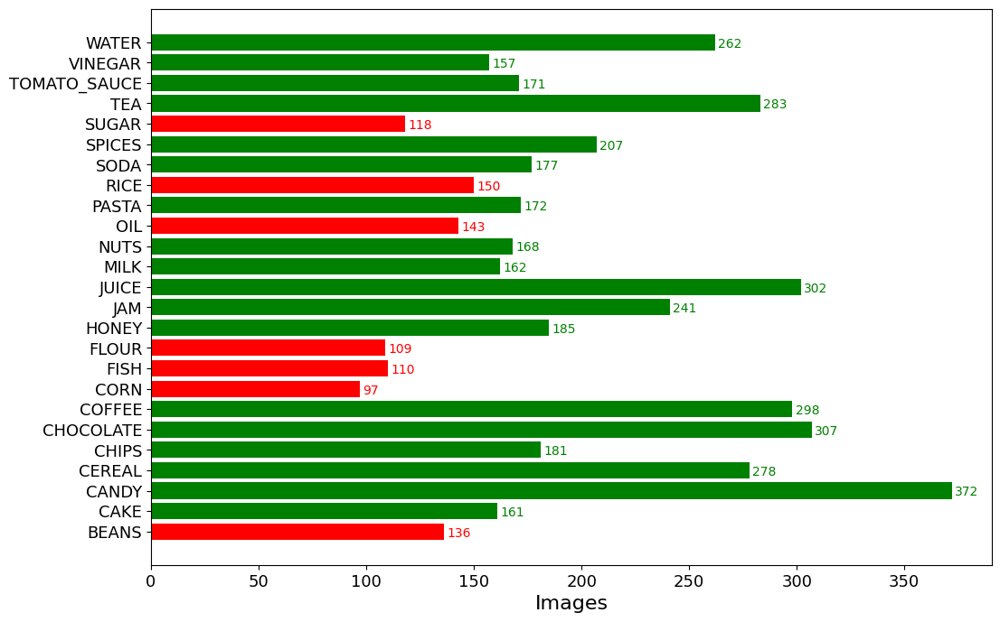

In [7]:
data = dict()

for i in os.listdir(original_img_dir):
    sub_dir = os.path.join(original_img_dir, i)
    count = len(os.listdir(sub_dir))
    data[i] = count


keys = data.keys()
values = list(data.values())

colors = ["red" if x <= 150 else "green" for x in values]

fig, ax = plt.subplots(figsize=(12, 8))
y_pos = np.arange(len(values))
plt.barh(y_pos, values, align="center", color=colors)
for i, v in enumerate(values):
    ax.text(v + 1.4, i - 0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel("Images", fontsize=16)
plt.xticks(color="black", fontsize=13)
plt.yticks(fontsize=13)
plt.show()

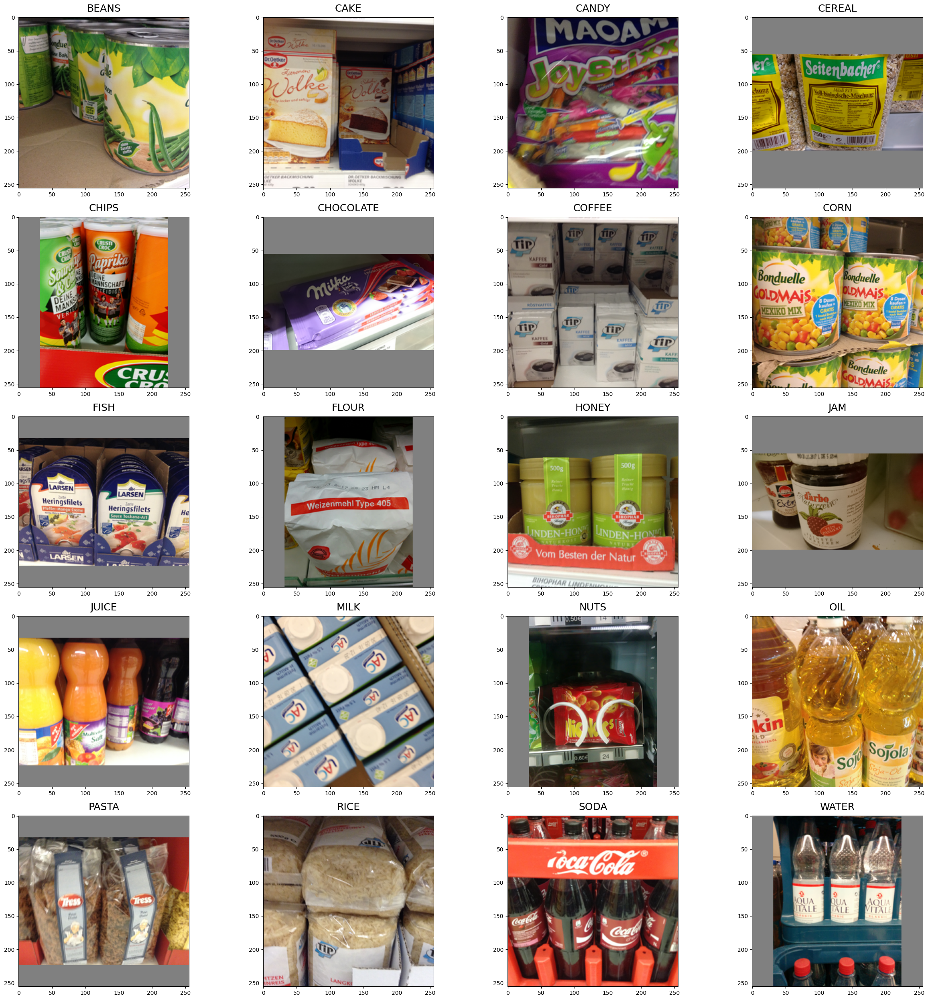

In [8]:
images = []

for food_folder in sorted(os.listdir(original_img_dir)):
    food_items = os.listdir(original_img_dir + "/" + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(original_img_dir, food_folder, food_selected))

fig = plt.figure(1, figsize=(25, 25))

for subplot, image_ in enumerate(images):
    category = os.path.normpath(image_).split(os.sep)[-2]
    imgs = plt.imread(image_)
    a, b, c = imgs.shape
    fig = plt.subplot(5, 4, min(subplot + 1, 20))
    fig.set_title(category, pad=10, size=18)
    plt.imshow(imgs)

plt.tight_layout()

In [9]:
def split_original_dataset_into_train_test_and_validation_sets():
    if os.listdir(train_img_dir) or os.listdir(val_img_dir) or os.listdir(test_img_dir):
        print("Directories are not empty. Skipping split...")
        return

    os.makedirs(train_img_dir, exist_ok=True)
    os.makedirs(val_img_dir, exist_ok=True)
    os.makedirs(test_img_dir, exist_ok=True)

    subdirectories = [
        name for name in os.listdir(original_img_dir) if os.path.isdir(os.path.join(original_img_dir, name))
    ]

    for subdir in subdirectories:
        subdir_path = os.path.join(original_img_dir, subdir)
        train_subdir_path = os.path.join(train_img_dir, subdir)
        val_subdir_path = os.path.join(val_img_dir, subdir)
        test_subdir_path = os.path.join(test_img_dir, subdir)

        os.makedirs(train_subdir_path, exist_ok=True)
        os.makedirs(val_subdir_path, exist_ok=True)
        os.makedirs(test_subdir_path, exist_ok=True)

        all_image_filenames = [
            filename for filename in os.listdir(subdir_path) if filename.endswith(".jpg") or filename.endswith(".png")
        ]
        train_val_image_filenames, test_image_filenames = model_selection.train_test_split(
            all_image_filenames, test_size=0.2, random_state=42
        )
        train_image_filenames, val_image_filenames = model_selection.train_test_split(
            train_val_image_filenames, test_size=0.25, random_state=42
        )

        for filename in train_image_filenames:
            source_path = os.path.join(subdir_path, filename)
            target_path = os.path.join(train_subdir_path, filename)
            shutil.copy(source_path, target_path)

        for filename in val_image_filenames:
            source_path = os.path.join(subdir_path, filename)
            target_path = os.path.join(val_subdir_path, filename)
            shutil.copy(source_path, target_path)

        for filename in test_image_filenames:
            source_path = os.path.join(subdir_path, filename)
            target_path = os.path.join(test_subdir_path, filename)
            shutil.copy(source_path, target_path)


split_original_dataset_into_train_test_and_validation_sets()

Directories are not empty. Skipping split...


In [10]:
n_classes = 25
batch_size = 32
img_width, img_height = 299, 299

train_datagen = keras.preprocessing.image.ImageDataGenerator(
    rescale=1.0 / 255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True
)

train_generator = train_datagen.flow_from_directory(
    train_img_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical"
)

val_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)

val_generator = val_datagen.flow_from_directory(
    val_img_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical"
)

Found 2948 images belonging to 25 classes.
Found 997 images belonging to 25 classes.


In [11]:
class_map = train_generator.class_indices
class_map

{'BEANS': 0,
 'CAKE': 1,
 'CANDY': 2,
 'CEREAL': 3,
 'CHIPS': 4,
 'CHOCOLATE': 5,
 'COFFEE': 6,
 'CORN': 7,
 'FISH': 8,
 'FLOUR': 9,
 'HONEY': 10,
 'JAM': 11,
 'JUICE': 12,
 'MILK': 13,
 'NUTS': 14,
 'OIL': 15,
 'PASTA': 16,
 'RICE': 17,
 'SODA': 18,
 'SPICES': 19,
 'SUGAR': 20,
 'TEA': 21,
 'TOMATO_SAUCE': 22,
 'VINEGAR': 23,
 'WATER': 24}

In [12]:
def build_and_train_model(model_type: Literal["sequential", "functional"]):
    nb_train_samples = train_generator.n
    nb_validation_samples = val_generator.n

    inception = keras.applications.inception_v3.InceptionV3(weights="imagenet", include_top=False)

    compile_args = {
        "optimizer": keras.optimizers.SGD(lr=0.0001, momentum=0.9),
        "loss": "categorical_crossentropy",
        "metrics": ["accuracy"],
    }

    checkpointer = keras.callbacks.ModelCheckpoint(
        filepath="artifacts/checkpoints/checkpoint_inceptionV3", verbose=1, save_best_only=True
    )
    csv_logger = keras.callbacks.CSVLogger("artifacts/csv_logs/history_inceptionV3.log")

    fit_args = {
        "steps_per_epoch": nb_train_samples // batch_size,
        "validation_data": val_generator,
        "validation_steps": nb_validation_samples // batch_size,
        "epochs": 50,
        "verbose": 1,
        "callbacks": [csv_logger, checkpointer],
    }

    if model_type == "sequential":
        model = keras.models.Sequential(
            layers=[
                inception,
                keras.layers.GlobalAveragePooling2D(),
                keras.layers.Dense(128, activation="relu"),
                keras.layers.Dropout(0.2),
                keras.layers.Dense(n_classes, kernel_regularizer=keras.regularizers.l2(0.005), activation="softmax"),
            ]
        )
    else:
        x = inception.output
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(128, activation="relu")(x)
        x = keras.layers.Dropout(0.2)(x)

        predictions = keras.layers.Dense(
            n_classes, kernel_regularizer=keras.regularizers.l2(0.005), activation="softmax"
        )(x)

        model = keras.models.Model(inputs=inception.input, outputs=predictions)

    model.compile(**compile_args)

    model.summary()

    history = model.fit(train_generator, **fit_args)

    return model, history


model, history = build_and_train_model("sequential")
# model, history = build_and_train_model("functional")

c:\Users\Computer\miniconda3\envs\ML-projekat\lib\site-packages\keras\optimizers\optimizer_v2\gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, None, None, 2048)  21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 25)                3225      
                                                                 
Total params: 22,068,281
Trainable params: 22,033,849
Non-trainable params: 34,432
_______________________________________

INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 73s 745ms/step - loss: 3.4727 - accuracy: 0.0521 - val_loss: 3.3712 - val_accuracy: 0.0847
Epoch 2/50
92/92 [==============================] - ETA: 0s - loss: 3.3094 - accuracy: 0.0892
Epoch 2: val_loss improved from 3.37121 to 3.24394, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 76s 827ms/step - loss: 3.3094 - accuracy: 0.0892 - val_loss: 3.2439 - val_accuracy: 0.1401
Epoch 3/50
92/92 [==============================] - ETA: 0s - loss: 3.1966 - accuracy: 0.1550
Epoch 3: val_loss improved from 3.24394 to 3.13496, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 77s 842ms/step - loss: 3.1966 - accuracy: 0.1550 - val_loss: 3.1350 - val_accuracy: 0.2077
Epoch 4/50
92/92 [==============================] - ETA: 0s - loss: 3.0910 - accuracy: 0.2030
Epoch 4: val_loss improved from 3.13496 to 3.02509, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 78s 845ms/step - loss: 3.0910 - accuracy: 0.2030 - val_loss: 3.0251 - val_accuracy: 0.2631
Epoch 5/50
92/92 [==============================] - ETA: 0s - loss: 2.9703 - accuracy: 0.2514
Epoch 5: val_loss improved from 3.02509 to 2.90864, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 79s 858ms/step - loss: 2.9703 - accuracy: 0.2514 - val_loss: 2.9086 - val_accuracy: 0.3065
Epoch 6/50
92/92 [==============================] - ETA: 0s - loss: 2.8447 - accuracy: 0.2936
Epoch 6: val_loss improved from 2.90864 to 2.78915, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 79s 862ms/step - loss: 2.8447 - accuracy: 0.2936 - val_loss: 2.7891 - val_accuracy: 0.3337
Epoch 7/50
92/92 [==============================] - ETA: 0s - loss: 2.7344 - accuracy: 0.3114
Epoch 7: val_loss improved from 2.78915 to 2.67450, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 79s 859ms/step - loss: 2.7344 - accuracy: 0.3114 - val_loss: 2.6745 - val_accuracy: 0.3710
Epoch 8/50
92/92 [==============================] - ETA: 0s - loss: 2.6096 - accuracy: 0.3621
Epoch 8: val_loss improved from 2.67450 to 2.55871, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 75s 818ms/step - loss: 2.6096 - accuracy: 0.3621 - val_loss: 2.5587 - val_accuracy: 0.3982
Epoch 9/50
92/92 [==============================] - ETA: 0s - loss: 2.4887 - accuracy: 0.4023
Epoch 9: val_loss improved from 2.55871 to 2.44492, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 487ms/step - loss: 2.4887 - accuracy: 0.4023 - val_loss: 2.4449 - val_accuracy: 0.4254
Epoch 10/50
92/92 [==============================] - ETA: 0s - loss: 2.3775 - accuracy: 0.4297
Epoch 10: val_loss improved from 2.44492 to 2.34054, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 43s 469ms/step - loss: 2.3775 - accuracy: 0.4297 - val_loss: 2.3405 - val_accuracy: 0.4516
Epoch 11/50
92/92 [==============================] - ETA: 0s - loss: 2.2741 - accuracy: 0.4489
Epoch 11: val_loss improved from 2.34054 to 2.23845, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 477ms/step - loss: 2.2741 - accuracy: 0.4489 - val_loss: 2.2384 - val_accuracy: 0.4738
Epoch 12/50
92/92 [==============================] - ETA: 0s - loss: 2.1557 - accuracy: 0.4949
Epoch 12: val_loss improved from 2.23845 to 2.14592, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 475ms/step - loss: 2.1557 - accuracy: 0.4949 - val_loss: 2.1459 - val_accuracy: 0.5000
Epoch 13/50
92/92 [==============================] - ETA: 0s - loss: 2.0565 - accuracy: 0.5254
Epoch 13: val_loss improved from 2.14592 to 2.05502, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 61s 661ms/step - loss: 2.0565 - accuracy: 0.5254 - val_loss: 2.0550 - val_accuracy: 0.5252
Epoch 14/50
92/92 [==============================] - ETA: 0s - loss: 1.9696 - accuracy: 0.5302
Epoch 14: val_loss improved from 2.05502 to 1.97127, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 75s 820ms/step - loss: 1.9696 - accuracy: 0.5302 - val_loss: 1.9713 - val_accuracy: 0.5474
Epoch 15/50
92/92 [==============================] - ETA: 0s - loss: 1.8704 - accuracy: 0.5724
Epoch 15: val_loss improved from 1.97127 to 1.89363, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 66s 716ms/step - loss: 1.8704 - accuracy: 0.5724 - val_loss: 1.8936 - val_accuracy: 0.5685
Epoch 16/50
92/92 [==============================] - ETA: 0s - loss: 1.8106 - accuracy: 0.5778
Epoch 16: val_loss improved from 1.89363 to 1.81685, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 478ms/step - loss: 1.8106 - accuracy: 0.5778 - val_loss: 1.8169 - val_accuracy: 0.5887
Epoch 17/50
92/92 [==============================] - ETA: 0s - loss: 1.7030 - accuracy: 0.6193
Epoch 17: val_loss improved from 1.81685 to 1.74633, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 480ms/step - loss: 1.7030 - accuracy: 0.6193 - val_loss: 1.7463 - val_accuracy: 0.6038
Epoch 18/50
92/92 [==============================] - ETA: 0s - loss: 1.6384 - accuracy: 0.6358
Epoch 18: val_loss improved from 1.74633 to 1.69119, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 482ms/step - loss: 1.6384 - accuracy: 0.6358 - val_loss: 1.6912 - val_accuracy: 0.6260
Epoch 19/50
92/92 [==============================] - ETA: 0s - loss: 1.5675 - accuracy: 0.6526
Epoch 19: val_loss improved from 1.69119 to 1.63325, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 483ms/step - loss: 1.5675 - accuracy: 0.6526 - val_loss: 1.6332 - val_accuracy: 0.6371
Epoch 20/50
92/92 [==============================] - ETA: 0s - loss: 1.5074 - accuracy: 0.6653
Epoch 20: val_loss improved from 1.63325 to 1.57784, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 487ms/step - loss: 1.5074 - accuracy: 0.6653 - val_loss: 1.5778 - val_accuracy: 0.6482
Epoch 21/50
92/92 [==============================] - ETA: 0s - loss: 1.4347 - accuracy: 0.6903
Epoch 21: val_loss improved from 1.57784 to 1.52849, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 481ms/step - loss: 1.4347 - accuracy: 0.6903 - val_loss: 1.5285 - val_accuracy: 0.6663
Epoch 22/50
92/92 [==============================] - ETA: 0s - loss: 1.4045 - accuracy: 0.7023
Epoch 22: val_loss improved from 1.52849 to 1.48264, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 476ms/step - loss: 1.4045 - accuracy: 0.7023 - val_loss: 1.4826 - val_accuracy: 0.6744
Epoch 23/50
92/92 [==============================] - ETA: 0s - loss: 1.3313 - accuracy: 0.7150
Epoch 23: val_loss improved from 1.48264 to 1.44351, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 473ms/step - loss: 1.3313 - accuracy: 0.7150 - val_loss: 1.4435 - val_accuracy: 0.6895
Epoch 24/50
92/92 [==============================] - ETA: 0s - loss: 1.3043 - accuracy: 0.7222
Epoch 24: val_loss improved from 1.44351 to 1.40276, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 475ms/step - loss: 1.3043 - accuracy: 0.7222 - val_loss: 1.4028 - val_accuracy: 0.6956
Epoch 25/50
92/92 [==============================] - ETA: 0s - loss: 1.2371 - accuracy: 0.7401
Epoch 25: val_loss improved from 1.40276 to 1.36880, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 474ms/step - loss: 1.2371 - accuracy: 0.7401 - val_loss: 1.3688 - val_accuracy: 0.7067
Epoch 26/50
92/92 [==============================] - ETA: 0s - loss: 1.1978 - accuracy: 0.7558
Epoch 26: val_loss improved from 1.36880 to 1.32984, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 487ms/step - loss: 1.1978 - accuracy: 0.7558 - val_loss: 1.3298 - val_accuracy: 0.7117
Epoch 27/50
92/92 [==============================] - ETA: 0s - loss: 1.1537 - accuracy: 0.7606
Epoch 27: val_loss improved from 1.32984 to 1.30357, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 490ms/step - loss: 1.1537 - accuracy: 0.7606 - val_loss: 1.3036 - val_accuracy: 0.7208
Epoch 28/50
92/92 [==============================] - ETA: 0s - loss: 1.1080 - accuracy: 0.7819
Epoch 28: val_loss improved from 1.30357 to 1.26577, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 489ms/step - loss: 1.1080 - accuracy: 0.7819 - val_loss: 1.2658 - val_accuracy: 0.7288
Epoch 29/50
92/92 [==============================] - ETA: 0s - loss: 1.0579 - accuracy: 0.7922
Epoch 29: val_loss improved from 1.26577 to 1.23891, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 482ms/step - loss: 1.0579 - accuracy: 0.7922 - val_loss: 1.2389 - val_accuracy: 0.7359
Epoch 30/50
92/92 [==============================] - ETA: 0s - loss: 1.0009 - accuracy: 0.8165
Epoch 30: val_loss improved from 1.23891 to 1.21406, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 482ms/step - loss: 1.0009 - accuracy: 0.8165 - val_loss: 1.2141 - val_accuracy: 0.7409
Epoch 31/50
92/92 [==============================] - ETA: 0s - loss: 0.9667 - accuracy: 0.8244
Epoch 31: val_loss improved from 1.21406 to 1.19191, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 491ms/step - loss: 0.9667 - accuracy: 0.8244 - val_loss: 1.1919 - val_accuracy: 0.7470
Epoch 32/50
92/92 [==============================] - ETA: 0s - loss: 0.9536 - accuracy: 0.8165
Epoch 32: val_loss improved from 1.19191 to 1.16808, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 484ms/step - loss: 0.9536 - accuracy: 0.8165 - val_loss: 1.1681 - val_accuracy: 0.7540
Epoch 33/50
91/92 [============================>.] - ETA: 0s - loss: 0.9191 - accuracy: 0.8238
Epoch 33: val_loss improved from 1.16808 to 1.15003, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 46s 495ms/step - loss: 0.9194 - accuracy: 0.8237 - val_loss: 1.1500 - val_accuracy: 0.7601
Epoch 34/50
92/92 [==============================] - ETA: 0s - loss: 0.8795 - accuracy: 0.8402
Epoch 34: val_loss improved from 1.15003 to 1.12253, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 46s 492ms/step - loss: 0.8795 - accuracy: 0.8402 - val_loss: 1.1225 - val_accuracy: 0.7631
Epoch 35/50
92/92 [==============================] - ETA: 0s - loss: 0.8717 - accuracy: 0.8471
Epoch 35: val_loss improved from 1.12253 to 1.11082, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 493ms/step - loss: 0.8717 - accuracy: 0.8471 - val_loss: 1.1108 - val_accuracy: 0.7581
Epoch 36/50
92/92 [==============================] - ETA: 0s - loss: 0.8391 - accuracy: 0.8495
Epoch 36: val_loss improved from 1.11082 to 1.09001, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 492ms/step - loss: 0.8391 - accuracy: 0.8495 - val_loss: 1.0900 - val_accuracy: 0.7611
Epoch 37/50
92/92 [==============================] - ETA: 0s - loss: 0.8078 - accuracy: 0.8594
Epoch 37: val_loss improved from 1.09001 to 1.07050, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 486ms/step - loss: 0.8078 - accuracy: 0.8594 - val_loss: 1.0705 - val_accuracy: 0.7661
Epoch 38/50
92/92 [==============================] - ETA: 0s - loss: 0.7754 - accuracy: 0.8755
Epoch 38: val_loss improved from 1.07050 to 1.05953, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 44s 481ms/step - loss: 0.7754 - accuracy: 0.8755 - val_loss: 1.0595 - val_accuracy: 0.7732
Epoch 39/50
92/92 [==============================] - ETA: 0s - loss: 0.7655 - accuracy: 0.8762
Epoch 39: val_loss improved from 1.05953 to 1.04152, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 483ms/step - loss: 0.7655 - accuracy: 0.8762 - val_loss: 1.0415 - val_accuracy: 0.7802
Epoch 40/50
92/92 [==============================] - ETA: 0s - loss: 0.7405 - accuracy: 0.8817
Epoch 40: val_loss improved from 1.04152 to 1.02830, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 482ms/step - loss: 0.7405 - accuracy: 0.8817 - val_loss: 1.0283 - val_accuracy: 0.7772
Epoch 41/50
92/92 [==============================] - ETA: 0s - loss: 0.7124 - accuracy: 0.8913
Epoch 41: val_loss improved from 1.02830 to 1.01932, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 484ms/step - loss: 0.7124 - accuracy: 0.8913 - val_loss: 1.0193 - val_accuracy: 0.7823
Epoch 42/50
92/92 [==============================] - ETA: 0s - loss: 0.6817 - accuracy: 0.8951
Epoch 42: val_loss improved from 1.01932 to 1.00554, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 46s 496ms/step - loss: 0.6817 - accuracy: 0.8951 - val_loss: 1.0055 - val_accuracy: 0.7812
Epoch 43/50
92/92 [==============================] - ETA: 0s - loss: 0.6770 - accuracy: 0.8995
Epoch 43: val_loss improved from 1.00554 to 0.99641, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 46s 497ms/step - loss: 0.6770 - accuracy: 0.8995 - val_loss: 0.9964 - val_accuracy: 0.7802
Epoch 44/50
92/92 [==============================] - ETA: 0s - loss: 0.6580 - accuracy: 0.9105
Epoch 44: val_loss improved from 0.99641 to 0.98586, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 46s 498ms/step - loss: 0.6580 - accuracy: 0.9105 - val_loss: 0.9859 - val_accuracy: 0.7863
Epoch 45/50
92/92 [==============================] - ETA: 0s - loss: 0.6417 - accuracy: 0.9129
Epoch 45: val_loss improved from 0.98586 to 0.97555, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 486ms/step - loss: 0.6417 - accuracy: 0.9129 - val_loss: 0.9756 - val_accuracy: 0.7883
Epoch 46/50
92/92 [==============================] - ETA: 0s - loss: 0.6132 - accuracy: 0.9184
Epoch 46: val_loss improved from 0.97555 to 0.96801, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 490ms/step - loss: 0.6132 - accuracy: 0.9184 - val_loss: 0.9680 - val_accuracy: 0.7853
Epoch 47/50
92/92 [==============================] - ETA: 0s - loss: 0.5992 - accuracy: 0.9170
Epoch 47: val_loss improved from 0.96801 to 0.96576, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 490ms/step - loss: 0.5992 - accuracy: 0.9170 - val_loss: 0.9658 - val_accuracy: 0.7843
Epoch 48/50
92/92 [==============================] - ETA: 0s - loss: 0.5931 - accuracy: 0.9201
Epoch 48: val_loss improved from 0.96576 to 0.95295, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 483ms/step - loss: 0.5931 - accuracy: 0.9201 - val_loss: 0.9530 - val_accuracy: 0.7893
Epoch 49/50
92/92 [==============================] - ETA: 0s - loss: 0.5792 - accuracy: 0.9194
Epoch 49: val_loss improved from 0.95295 to 0.94622, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 489ms/step - loss: 0.5792 - accuracy: 0.9194 - val_loss: 0.9462 - val_accuracy: 0.7913
Epoch 50/50
92/92 [==============================] - ETA: 0s - loss: 0.5557 - accuracy: 0.9290
Epoch 50: val_loss improved from 0.94622 to 0.92915, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 46s 495ms/step - loss: 0.5557 - accuracy: 0.9290 - val_loss: 0.9291 - val_accuracy: 0.7984


In [13]:
model.save(path_to_model)

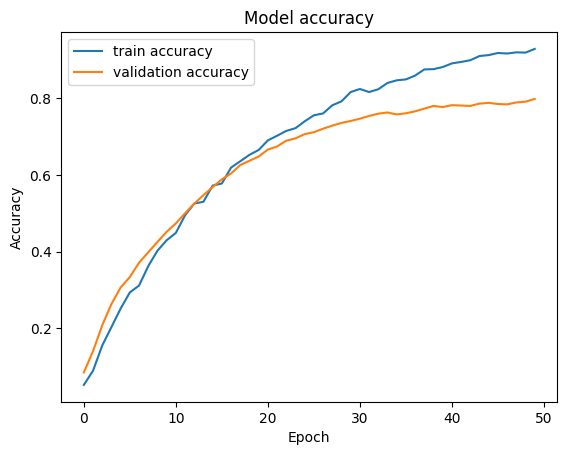

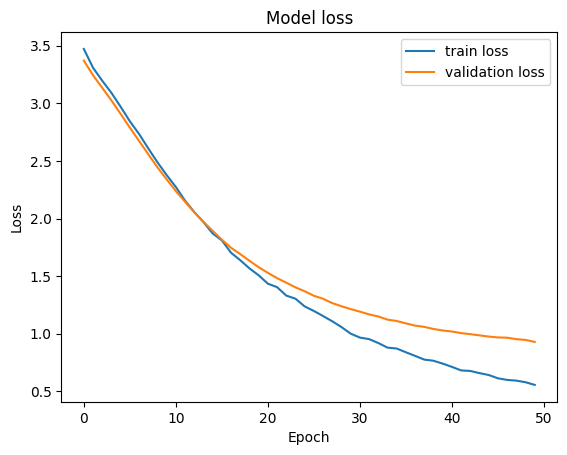

In [14]:
def plot_accuracy(history: keras.callbacks.History):
    plt.plot(history.history["accuracy"], label="train accuracy")
    plt.plot(history.history["val_accuracy"], label="validation accuracy")
    plt.title("Model accuracy")
    plt.ylabel("Accuracy")
    plt.xlabel("Epoch")
    plt.legend(loc="best")
    plt.savefig("artifacts/plots/Accuracy_InceptionV3")
    plt.show()


def plot_loss(history: keras.callbacks.History):
    plt.plot(history.history["loss"], label="train loss")
    plt.plot(history.history["val_loss"], label="validation loss")
    plt.title("Model loss")
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.legend(loc="best")
    plt.savefig("artifacts/plots/Loss_InceptionV3")
    plt.show()


plot_accuracy(history)
plot_loss(history)

In [15]:
keras.backend.clear_session()
print("Loading the model..")
model = keras.models.load_model(path_to_model)

if model is not None:
    print("Model loaded!")
    model: keras.models.Model
else:
    raise ValueError("Failed to load the model from the specified path.")

Loading the model..
Model loaded!


In [16]:
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)

test_generator = test_datagen.flow_from_directory(
    test_img_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical"
)

Found 1002 images belonging to 25 classes.


In [17]:
scores = model.evaluate_generator(test_generator)

print("Test Accuracy: {:.3f}".format(scores[1]))

C:\Users\Computer\AppData\Local\Temp\ipykernel_41524\430069557.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model.evaluate_generator(test_generator)


Test Accuracy: 0.776


In [18]:
categories = {v: k for k, v in class_map.items()}


def predict_image(filename: str, model: keras.models.Model):
    img_ = keras.preprocessing.image.load_img(filename, target_size=(299, 299))
    img_array = keras.preprocessing.image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.0

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(categories[index]))
    plt.imshow(img_array)


def predict_dir(filedir: str, model: keras.models.Model):
    cols = 5
    pos = 0
    images = []
    total_images = len(os.listdir(filedir))
    rows = total_images // cols + 1

    true = os.path.normpath(filedir).split(os.sep)[-1]

    fig = plt.figure(1, figsize=(25, 25))

    for i in sorted(os.listdir(filedir)):
        images.append(os.path.join(filedir, i))

    for subplot, imggg in enumerate(images):
        img_ = keras.preprocessing.image.load_img(imggg, target_size=(299, 299))
        img_array = keras.preprocessing.image.img_to_array(img_)

        img_processed = np.expand_dims(img_array, axis=0)

        img_processed /= 255.0
        prediction = model.predict(img_processed)
        index = np.argmax(prediction).astype(int)

        pred = categories.get(index)
        if pred == true:
            pos += 1

        fig = plt.subplot(rows, cols, subplot + 1)
        fig.set_title(categories.get(index, ""), pad=10, size=18)
        plt.imshow(img_array)

    acc = pos / total_images
    print("Accuracy of Test : {:.2f} ({pos}/{total})".format(acc, pos=pos, total=total_images))
    plt.tight_layout()

1/1 [==============================] - 1s 590ms/step


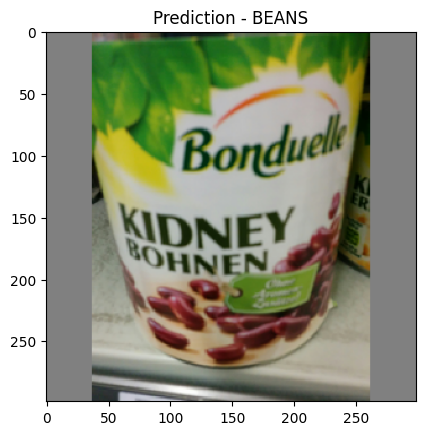

In [19]:
predict_image(f"{test_img_dir}/BEANS/BEANS0004.png", model)

1/1 [==============================] - 0s 16ms/step
Accuracy of Test : 0.64 (21/33)


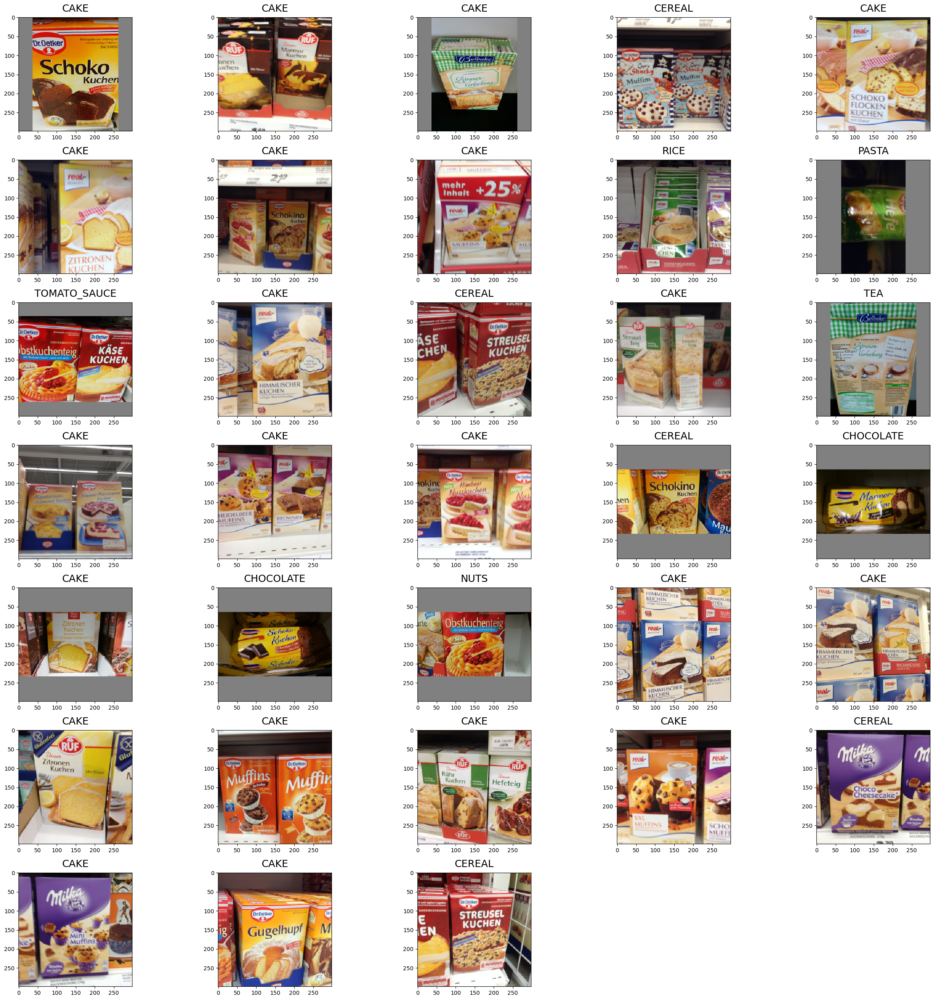

In [20]:
predict_dir(f"{test_img_dir}/CAKE", model)

In [21]:
img_width, img_height = 299, 299


def labels_confusion_matrix():
    mapping: dict[str, int] = {}
    for i, j in enumerate(sorted(os.listdir(test_img_dir))):
        mapping[j] = i

    real: list[int] = []
    predicted: list[int] = []

    for i in os.listdir(test_img_dir):
        true = os.path.join(test_img_dir, i)
        true = os.path.split(true)[-1]
        true = mapping[true]

        for j in os.listdir(os.path.join(test_img_dir, i)):
            img_ = keras.preprocessing.image.load_img(
                os.path.join(test_img_dir, i, j), target_size=(img_height, img_width)
            )
            img_array = keras.preprocessing.image.img_to_array(img_)
            img_processed = np.expand_dims(img_array, axis=0)
            img_processed /= 255.0
            prediction = model.predict(img_processed)
            index = np.argmax(prediction).astype(int)

            predicted.append(index)
            real.append(true)

    return (real, predicted)


def display_confusion_matrix(real: list[int], predicted: list[int]):
    cmap = "viridis"
    cm_plot_labels = [i for i in range(25)]

    cm = metrics.confusion_matrix(y_true=real, y_pred=predicted)
    df_cm = pd.DataFrame(cm, cm_plot_labels, cm_plot_labels)
    sns.set(font_scale=1.1)
    plt.figure(figsize=(15, 10))
    s = sns.heatmap(df_cm, annot=True, cmap=cmap)
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.savefig("artifacts/metrics/confusion_matrix.png")
    plt.show()

1/1 [==============================] - 0s 17ms/step


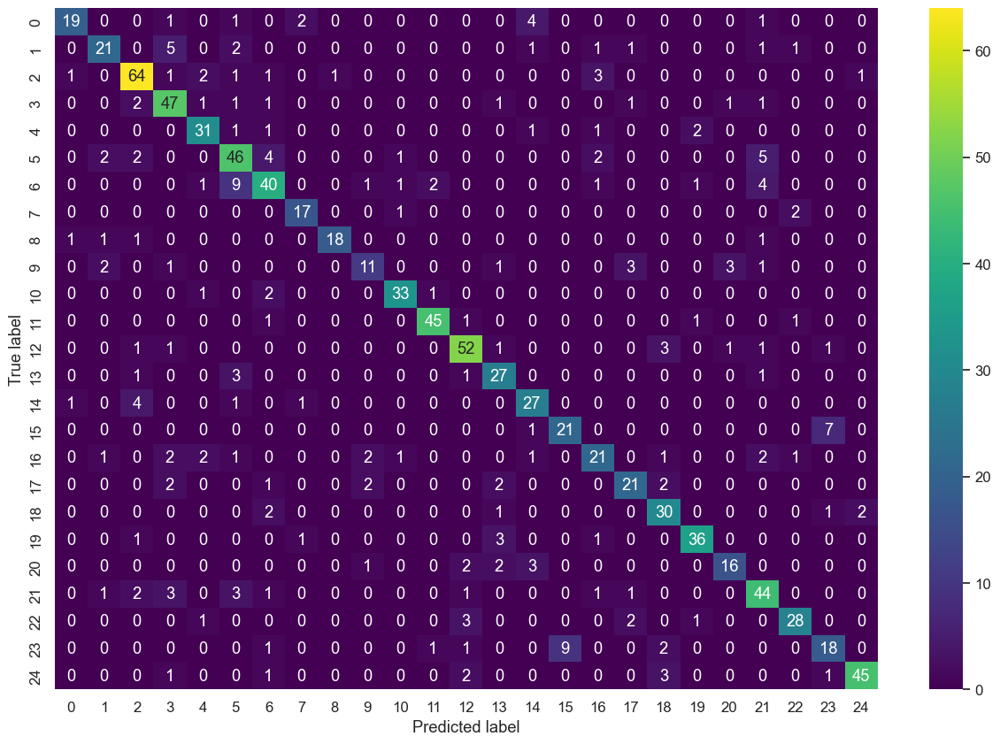

In [22]:
y_true, y_pred = labels_confusion_matrix()
display_confusion_matrix(y_true, y_pred)